# Incheon_2018 Network using Folium

## UNIST School of Natural Science

### Mathematical Science Major

### 20121229 JunPyo Park

About Folium?

<img src="https://trello-attachments.s3.amazonaws.com/59103d52b56a24582f00dc97/5ac9878e1e1550dea50a1f5b/adbdfd2fff8aa3075bfa1bbb72335221/image.png"></img>

Github Link : https://github.com/python-visualization/folium

## Results

<img src="https://trello-attachments.s3.amazonaws.com/59103d52b56a24582f00dc97/5ac9b7dd71aece79325a5e04/bbd49436dca30dd46f8a814407629162/image.png"></img>

## Codes

In [53]:
import os
import folium
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

Read processed Data for whole Incheon

In [54]:
nodes = pd.read_csv('incheon_nodes.csv')
links = pd.read_csv('incheon_links.csv')

In [55]:
nodes = nodes[['Id','NODE_NAME','STNL_REG','latitude','longitude']]
incheon_id = dict()
for i in nodes['Id'] :
    incheon_id[i] = 0
len(nodes)

2948

Table for STNL_REG code

<img src="https://trello-attachments.s3.amazonaws.com/59103d52b56a24582f00dc97/5ac9b243203ce41785b600e0/96a8303881a66ac11ea45124b0635d92/image.png"></img>

In whole Incheon case, STNL_REG == 161~170

In [56]:
links = links[['Source','Target']]
links.head()

,Source,Target
0,1610003100,1680004000
1,1610003100,1610003000
2,1680003800,1610003100
3,1610000800,1610000700
4,1610002900,1610003000


We shoud remove the links which is not connected in Incheon_nodes

In [57]:
source_in = links['Source'].apply(lambda x : x in incheon_id) # check Sources are in incheon_id
target_in = links['Target'].apply(lambda x : x in incheon_id) # check Targets are in incheon_id
# source_in and target_in are boolean type pandas.Series which contains True or False

In [58]:
incheon_links = links[source_in & target_in] # contain if both target and source are contained in incheon_id
incheon_links.head()

,Source,Target
0,1610003100,1680004000
1,1610003100,1610003000
2,1680003800,1610003100
3,1610000800,1610000700
4,1610002900,1610003000


By checking the length, we can find that links are reduced from 8679 to 8591

In [59]:
print(len(links))
print(len(incheon_links))

8679
8591


Calculating Degree of each incheon_nodes

In [60]:
for ix, row in incheon_links.iterrows():
    incheon_id[row['Source']] += 1
    incheon_id[row['Target']] += 1

In [61]:
# Positioning the Standard Point for out Folium Map
# std_point = tuple(nodes[nodes['NODE_NAME']=='구암초교'][['latitude','longitude']].iloc[0])
std_point = tuple(nodes.head(1)[['latitude','longitude']].iloc[0])
std_point

(37.53527874510225, 126.56003651115343)

In [62]:
nodes.head()

,Id,NODE_NAME,STNL_REG,latitude,longitude
0,1610003100,영종대교 서단(상하부도로 합류),161,37.535279,126.560037
1,1610003000,공항입구IC(본선),161,37.507276,126.512479
2,1610002900,공항입구IC 서측(연결로),161,37.506817,126.503792
3,1610002400,삼목지하차도,161,37.491616,126.481301
4,1610002300,공항신도시IC 북측(본선 서울방,161,37.489293,126.491712


#### Using Networkx

In [63]:
G = nx.Graph()
# R is the Earth's radius
R = 6371e3

for idx,row in nodes.iterrows():
    G.add_node(row['Id'],Label=row['NODE_NAME'],latitude=row['latitude'], longitude=row['longitude'])
for idx,row in incheon_links.iterrows():
    ## Calculate the distance between Source and Target Nodes
    lon1 = float(nodes[nodes['Id'] == row['Source']]['longitude'] * np.pi/180)
    lat1 = float(nodes[nodes['Id'] == row['Source']]['latitude'] * np.pi/180)
    lon2 = float(nodes[nodes['Id'] == row['Target']]['longitude'] * np.pi/180)
    lat2 = float(nodes[nodes['Id'] == row['Target']]['latitude'] * np.pi/180)
    
    d_lat = lat2 - lat1
    d_lon = lon2 - lon1
    a = np.sin(d_lat/2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(d_lon/2) ** 2
    c = 2 * np.arctan2(a**0.5, (1-a) ** 0.5)
    d = R * c
    ## Link attribute, 'Source', 'Target' and weight = 'Length between them'
    G.add_edge(row['Source'],row['Target'],weight = d)

In [64]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 2948
Number of edges: 4345
Average degree:   2.9478


#### Using Gephi

In [13]:
nx.write_gexf(G,'Incheon_2018.gexf')

## Gephi Result

<img src="https://trello-attachments.s3.amazonaws.com/59103d52b56a24582f00dc97/5ad394e5aded2485139e183c/2a5984423d9df559b634f6dd50740fd7/image.png"></img>

## Draw Node

In [16]:
map_osm = folium.Map(location=std_point, zoom_start=10)

for ix, row in nodes.iterrows():
    location = (row['latitude'], row['longitude'])
    folium.Circle(
        location=location,
        radius=incheon_id[row['Id']] * 15,
        color='white',
        weight=1,
        fill_opacity=0.6,
        opacity=1,
        fill_color='red',
        fill=True,  # gets overridden by fill_color
        # popup=str(row['Id'])
    ).add_to(map_osm)
    # folium.Marker(location, popup=row['NODE_NAME']).add_to(map_osm)
# it takes some time.....
map_osm

## Draw Links

In [11]:
kw = {'opacity': 0.5, 'weight': 2}
for ix, row in incheon_links.iterrows():
    start = tuple(nodes[nodes['Id']==row['Source']][['latitude','longitude']].iloc[0])
    end = tuple(nodes[nodes['Id']==row['Target']][['latitude','longitude']].iloc[0])
    folium.PolyLine(
        locations=[start, end],
        color='blue',
        line_cap='round',
        **kw,
    ).add_to(map_osm)
# it takes some time.....
map_osm

### Mathematical Analysis

In [65]:
A = nx.to_numpy_matrix(G, dtype=np.bool)# adjacency matrix

In [66]:
A

matrix([[False,  True, False, ..., False, False, False],
        [ True, False,  True, ..., False, False, False],
        [False,  True, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False,  True],
        [False, False, False, ..., False,  True, False]])

In [67]:
A.shape

(2948, 2948)

In [70]:
ind = []
for i in range(10):
    ind.append('Length ' + str(i+1))

In [68]:

cycle = pd.Series(index = ind)
for i in range(10):
    cycle.iloc[i] = np.trace(np.linalg.matrix_power(A,i+1))
cycle

Length 1        0.0
Length 2     2947.0
Length 3      588.0
Length 4     2947.0
Length 5     1816.0
Length 6     2947.0
Length 7     2439.0
Length 8     2947.0
Length 9     2740.0
Length 10    2947.0
dtype: float64

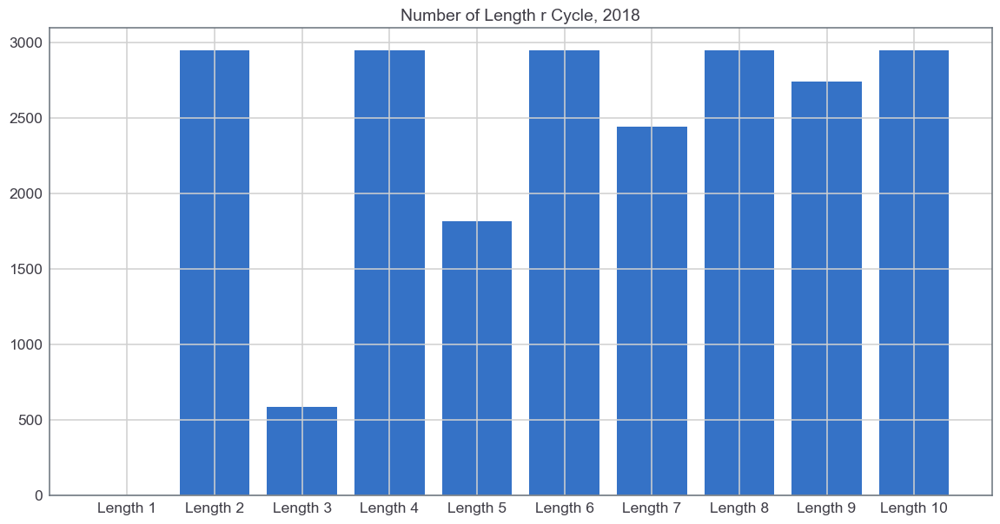

In [69]:
plt.figure(1, figsize=(14, 7))# control figure size
plt.bar(cycle.index, cycle)
plt.title('Number of Length r Cycle, 2018', fontsize=14);
# plt.show()

In [71]:
dat = pd.Series([0,2198,465, 2198, 1379, 2198, 1849, 2198, 2038, 2198],index=ind)

Length 1        0.0
Length 2     2198.0
Length 3      465.0
Length 4     2198.0
Length 5     1379.0
Length 6     2198.0
Length 7     1849.0
Length 8     2198.0
Length 9     2038.0
Length 10    2198.0

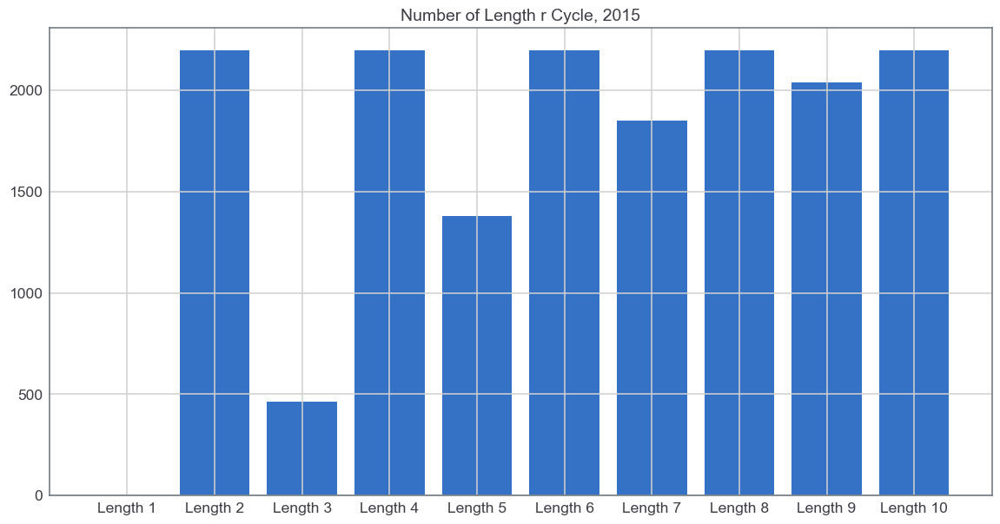

In [73]:
plt.figure(1, figsize=(14, 7))# control figure size
plt.bar(dat.index, dat)
plt.title('Number of Length r Cycle, 2015', fontsize=14);
plt.show()

#### Components

In [21]:
nx.number_connected_components(G)

4

In [72]:
idx = []
for i in range(5):
    idx.append('Length' + str(2*i+1))

In [16]:
result_2015

Length1       0
Length3     465
Length5    1379
Length7    1849
Length9    2038
dtype: int64

In [7]:
result_2018 = pd.Series([0,588,1816,2439,2740], index=idx)
result_2015 = pd.Series([0,465,1379,1849,2038], index=idx)

In [30]:
from jupyterthemes import jtplot

In [51]:
# choose which theme to inherit plotting style from
# onedork | grade3 | oceans16 | chesterish | monokai | solarizedl | solarizedd
jtplot.style(theme='grade3')
# jtplot.reset()

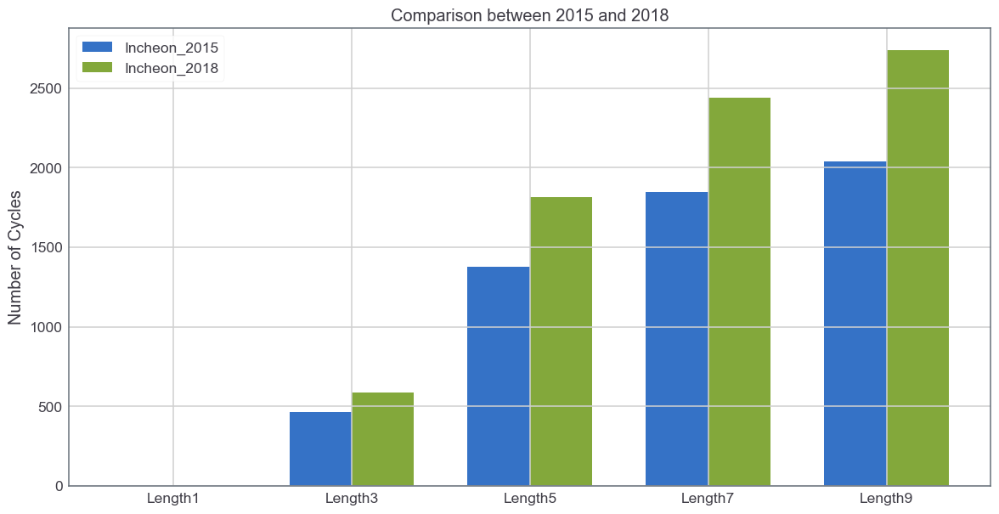

In [52]:
width = 0.35
ind = np.arange(5)
fig, ax = plt.subplots(figsize=(14,7))
rects1 = ax.bar(ind-width/2, result_2015, width, label = 'Incheon_2015')
rects2 = ax.bar(ind+width/2, result_2018, width, label = 'Incheon_2018')
ax.set_ylabel('Number of Cycles')
ax.set_title('Comparison between 2015 and 2018')
ax.set_xticks(ind)
ax.set_xticklabels(idx)
ax.legend()
plt.show()